In [3]:
import sys
sys.path.insert(0,  "../../" )
import chimes as chm

# Basic everyday packages
import pandas as pd
import matplotlib.pyplot as plt 
import plotly.graph_objects as go
import numpy as np
import plotly
import copy

# Improving display of tables
from IPython.display import display,HTML,Markdown
from IPython.display import IFrame
from itables import init_notebook_mode,options
options.columnDefs = [{"className": "dt-left", "targets": "_all"}]
options.classes="display nowrap compact"
options.scrollY="400px"
options.scrollCollapse=True
options.paging=False
pd.set_option('display.max_colwidth', None)
pd.set_option("display.colheader_justify","left")

# Interactive matplotlib figures, use plt.close('all') when too many are open
init_notebook_mode(all_interactive=True)
%matplotlib widget

## Tomas Mazak's workaround for Latex plotly rendering
import plotly.graph_objs as go
from IPython.display import display, HTML
plotly.offline.init_notebook_mode()
display(HTML('<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'))


<IPython.core.display.Javascript object>

In [16]:
# Pytest for the library if you made changes to the code
!pytest "..\\..\\tests" -v --cov=chimes --cov-report html

============================= test session starts =============================
platform win32 -- Python 3.11.0, pytest-7.4.0, pluggy-1.2.0 -- C:\ProgramData\Anaconda3\envs\py3.11\python.exe
cachedir: .pytest_cache
rootdir: c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS
plugins: anyio-3.6.2, dash-2.8.1, Faker-25.2.0, cov-4.1.0, mocha-0.4.0
collecting ... collected 124 items

..\..\tests\unit\chimes\config_test.py::TestConfig::test_get_config PASSED [  0%]
..\..\tests\unit\chimes\config_test.py::TestConfig::test_reset_config PASSED [  1%]
..\..\tests\unit\chimes\config_test.py::TestConfig::test_set_value PASSED [  2%]
..\..\tests\unit\chimes\integration\test_00_BASIC.py::Test00_Get::test01a_CHM_get_available_models PASSED [  3%]
..\..\tests\unit\chimes\integration\test_00_BASIC.py::Test00_Get::test01b_CHM_get_model_documentation PASSED [  4%]
..\..\tests\unit\chimes\integration\test_00_BASIC.py::Test00_Get::test01c_CHM_get_available_fields PASSED [  4%]
..\..\tests\unit\chimes\integ

time step 3000 / 3000


c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\unit\../..\models\Core\_model_GK.py:79: RuntimeWarning:

overflow encountered in square

c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\unit\../..\models\Core\_model_GK.py:67: RuntimeWarning:

overflow encountered in multiply

c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\unit\../..\models\Core\_model_GK.py:60: RuntimeWarning:

invalid value encountered in divide

c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\unit\../..\models\Core\_model_GK.py:61: RuntimeWarning:

invalid value encountered in divide

c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\unit\../..\models\Core\_model_GK.py:66: RuntimeWarning:

invalid value encountered in subtract



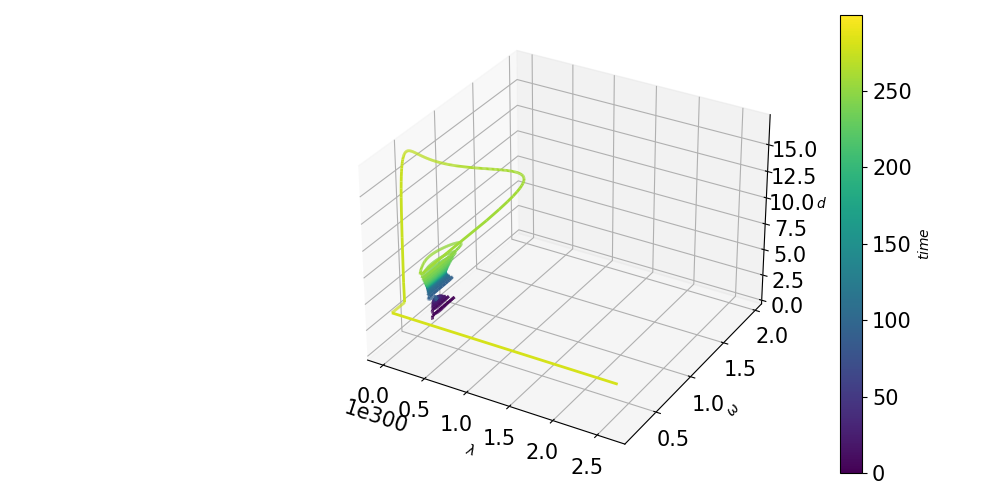

In [99]:
hub=chm.Hub('GK')
#hub.get_summary()
hub.set_preset('debtstabilisation')
hub.set_fields(dt=0.1)#,inflation=0)
hub.run(steps=900,verb=False)
R=hub.get_dfields()
K0=R['K']['value'][900,0,0,0,0]
hub.set_fields(**{'K':K0/1.2},noreset=True)
hub.run()
chm.Plots.nyaxis(hub,[['employment','omega'],['d']])
#hub.plot(filters_units=['','Units','y'],separate_variables={'':['pi','kappa']},title='capital shock')
chm.Plots.XYZ(hub,'employment','omega','d')

time step 2500 / 2500


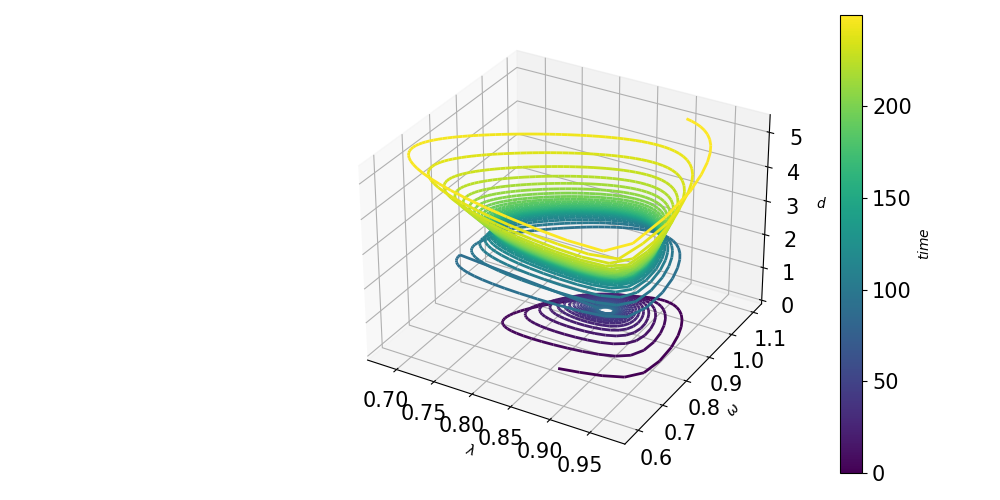

In [100]:
hub=chm.Hub('GK')
#hub.get_summary()
hub.set_preset('debtstabilisation')
hub.set_fields(dt=0.1,Tsim=250)#,inflation=0)
hub.run(steps=900,verb=False)
R=hub.get_dfields()
K0=R['K']['value'][900,0,0,0,0]
hub.set_fields(**{'K':K0/1.25},noreset=True)
hub.run()
chm.Plots.nyaxis(hub,[['employment','omega'],['d']])
#hub.plot(filters_units=['','Units','y'],separate_variables={'':['pi','kappa']},title='capital shock')
chm.Plots.XYZ(hub,'employment','omega','d')

time step 1000 / 1000


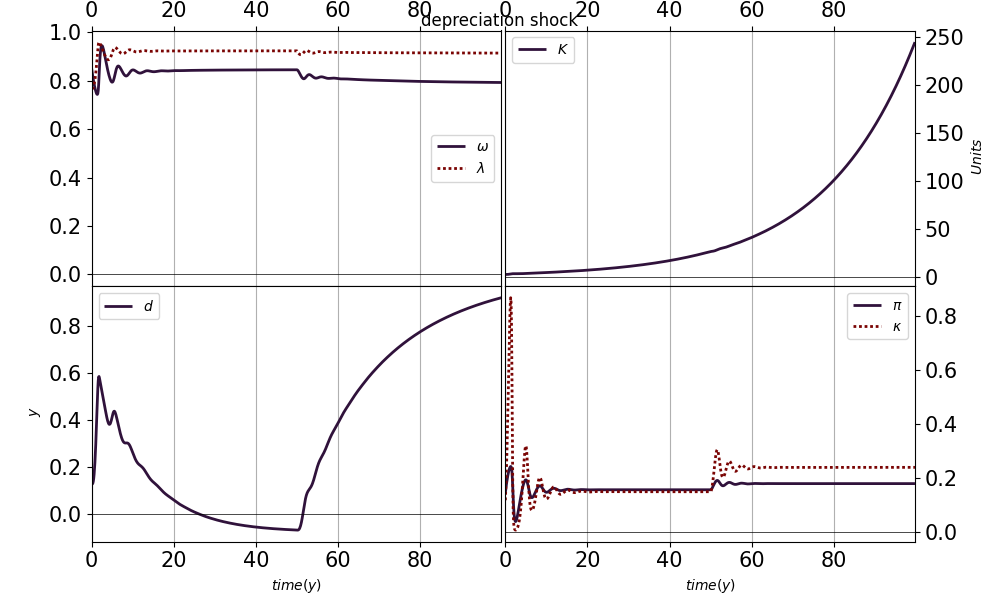

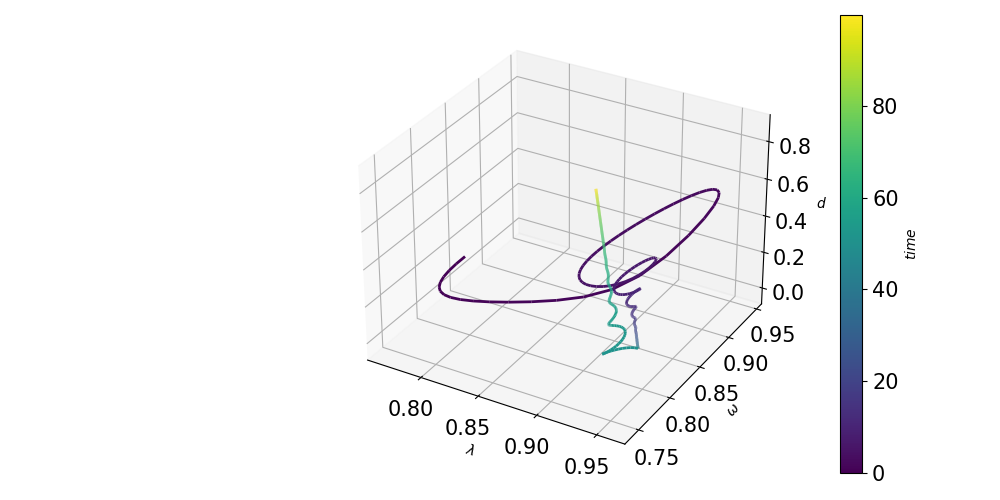

In [66]:
hub=chm.Hub('GK')
hub.set_fields(Tsim=100)
hub.run(steps=500,verb=False)
R=hub.get_dfields()
delta=R['delta']['value'][0,0,0,0]
hub.set_fields(**{'delta':delta*7},noreset=True)
hub.run()
hub.plot(filters_units=['','Units','y'],separate_variables={'':['pi','kappa']},title='depreciation shock')

chm.Plots.nyaxis(hub,[['employment','omega'],['d'],['delta']])
chm.Plots.XYZ(hub,'employment','omega','d')

In [40]:
R=hub.get_dfields()

In [44]:
R['delta']['shocks']

{0: array([[[[0.005]]]]), 500: array([[[[0.035]]]])}

In [43]:
np.shape(R['delta']['value'])

(1, 1, 1, 1)

time step 1000 / 1000


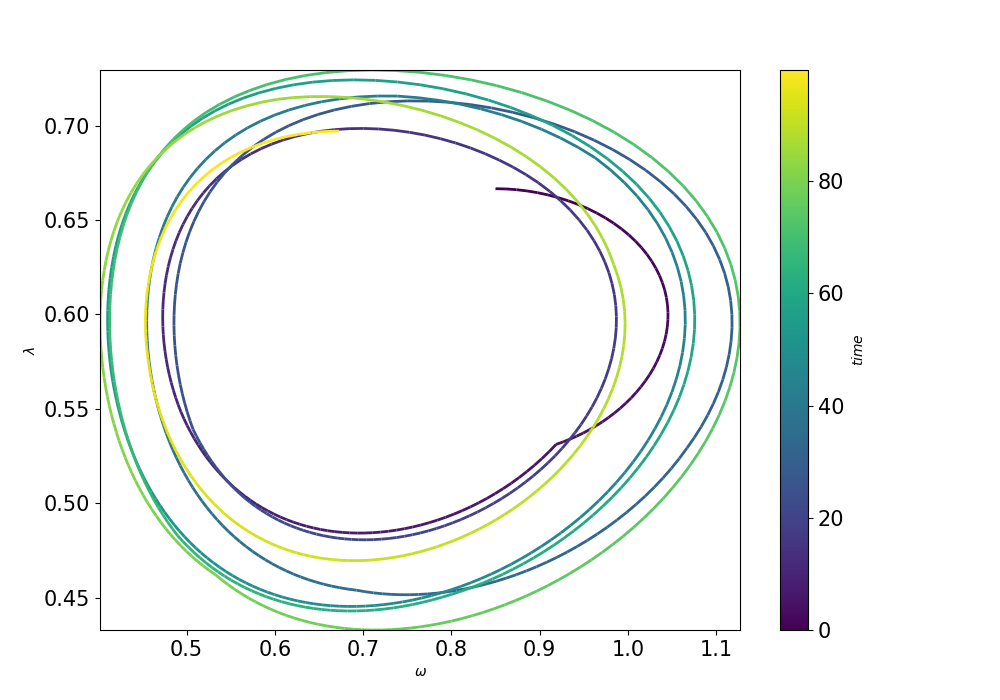

In [82]:
### Multiples random shocks

import numpy as np
hub=chm.Hub('Goodwin_example',verb=False)

################################
currentvalues = {
    'delta':0.05,
    'alpha':0.02,
    'n':0.025,
}
events = {k:[] for k in list(currentvalues.keys())+['iteration']}
events['iteration'].append(0)

stepmaxsize = 100
stepminsizse = 10

relativevariation = 0.1

################################

itot=0
while 1:
    morestep = np.random.randint(stepminsizse,stepmaxsize)
    itot+=morestep
    if itot > 998:
        break
    else:
        hub.run(steps=morestep,verb=False)

    for k,v in currentvalues.items():
        currentvalues[k]*= np.random.normal(1,relativevariation)
        events[k].append(v)
    events['iteration'].append(itot)

    hub.set_fields(**currentvalues,
                   noreset=True,verb=False)

hub.run()
#hub.plot(filters_units=['','Units','y'],
#         title='Chocs')
chm.Plots.nyaxis(hub,[['omega','employment'],['n','alpha','delta']],title='Chocs')
chm.Plots.XY(hub,'omega','employment')


Already run: reset and run
Already run: reset and run
time step 500 / 500


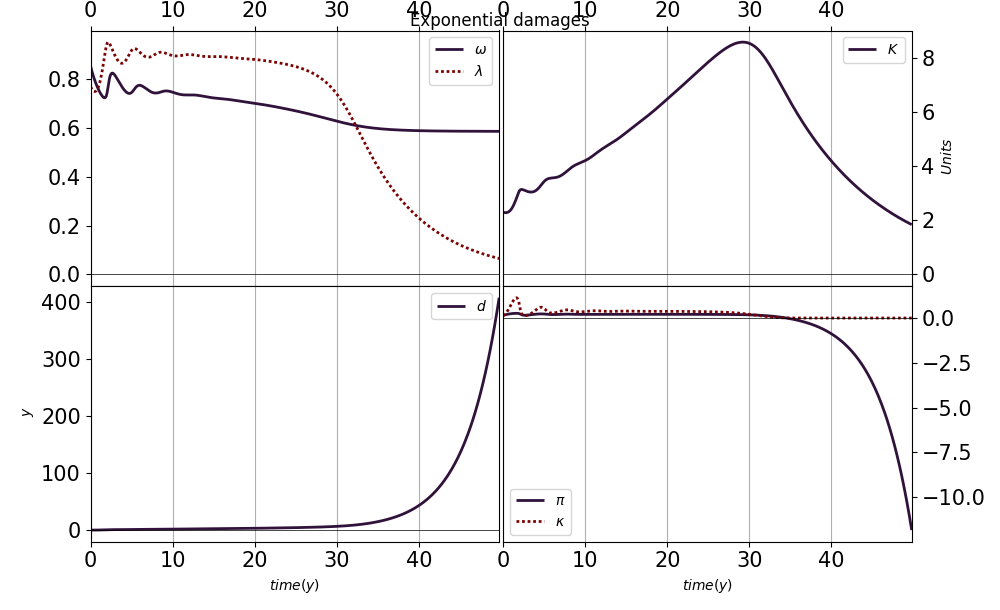

In [86]:
hub=chm.Hub('GK')
hub.set_fields(Tsim=50)
for i in range(20):
    hub.run(steps=50,verb=False)
    R=hub.get_dfields()
    delta=R['delta']['value'][0,0,0,0]
    hub.set_fields(**{'delta':delta*1.15},noreset=True,verb=False)
hub.run()
chm.Plots.nyaxis(hub,[['omega','employment'],['d'],['delta']],title='Chocs')
hub.plot(filters_units=['','Units','y'],separate_variables={'':['pi','kappa']},title='Exponential damages')


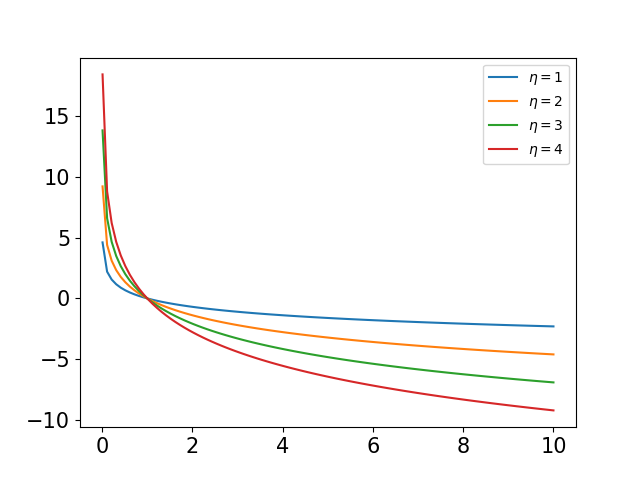

In [111]:
plt.figure()
x=np.linspace(0.01,10,100)
for a in range(1,5):
    y=-a*(np.log(x))
    #y=-a*(x-1)/x
    plt.plot(x,y,label='$\eta=$'+str(a))
plt.legend()
plt.show()